In [ ]:
!pip install einops

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 3.4 MB/s eta 0:00:00


In [ ]:
import os
import time
import glob
import random
import numpy as np
from PIL import Image
from math import log10
from random import randrange
import matplotlib.pyplot as plt

from einops.layers.torch import Rearrange
from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
import torch.nn.functional as F

import torch.optim as optim
from torchvision.models import vgg16

import torch.utils.data as data
from torch.utils.data import Dataset, DataLoader
import torchvision.utils as utils
from torchvision.utils import make_grid

from torchvision.transforms import Compose, ToTensor, Normalize
from torchvision.transforms import ToTensor, RandomCrop, Resize
from torchvision.transforms.functional import hflip, rotate, crop

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
os.path.exists("/content/drive/MyDrive/my_project/haze/")

True

In [ ]:
# Spatial Attention block
class SpatialAttention(nn.Module):
    def __init__(self):
        super(SpatialAttention, self).__init__()
        self.sa = nn.Conv2d(2, 1, 7, padding=3, padding_mode='reflect' ,bias=True)

    def forward(self, x):
        x_avg = torch.mean(x, dim=1, keepdim=True)
        x_max, _ = torch.max(x, dim=1, keepdim=True)
        x2 = torch.concat([x_avg, x_max], dim=1)
        sattn = self.sa(x2)
        return sattn

# Channel Attention block
class ChannelAttention(nn.Module):
    def __init__(self, dim, reduction = 8):
        super(ChannelAttention, self).__init__()
        self.gap = nn.AdaptiveAvgPool2d(1)
        self.ca = nn.Sequential(
            nn.Conv2d(dim, dim // reduction, 1, padding=0, bias=True),
            nn.ReLU(inplace=True),
            nn.Conv2d(dim // reduction, dim, 1, padding=0, bias=True),
        )

    def forward(self, x):
        x_gap = self.gap(x)
        cattn = self.ca(x_gap)
        return cattn

# Pixel Attention block
class PixelAttention(nn.Module):
    def __init__(self, dim):
        super(PixelAttention, self).__init__()
        self.pa2 = nn.Conv2d(2 * dim, dim, 7, padding=3, padding_mode='reflect' ,groups=dim, bias=True)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x, pattn1):
        B, C, H, W = x.shape
        x = x.unsqueeze(dim=2) # B, C, 1, H, W
        pattn1 = pattn1.unsqueeze(dim=2) # B, C, 1, H, W
        x2 = torch.cat([x, pattn1], dim=2) # B, C, 2, H, W
        x2 = Rearrange('b c t h w -> b (c t) h w')(x2)
        pattn2 = self.pa2(x2)
        pattn2 = self.sigmoid(pattn2)
        return pattn2

# CGA fusion block
class CGAFusion(nn.Module):
    def __init__(self, dim, reduction=8):
        super(CGAFusion, self).__init__()
        self.sa = SpatialAttention()
        self.ca = ChannelAttention(dim, reduction)
        self.pa = PixelAttention(dim)
        self.conv = nn.Conv2d(dim, dim, 1, bias=True)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x, y):
        initial = x + y
        cattn = self.ca(initial)
        sattn = self.sa(initial)
        pattn1 = sattn + cattn
        pattn2 = self.sigmoid(self.pa(initial, pattn1))
        result = initial + pattn2 * x + (1 - pattn2) * y
        result = self.conv(result)
        return result

# PA Layer
class PALayer(nn.Module):
    def __init__(self, channel):
        super(PALayer, self).__init__()
        self.pa = nn.Sequential(
                nn.Conv2d(channel, channel // 8, 1, padding=0, bias=True),
                nn.ReLU(inplace=True),
                nn.Conv2d(channel // 8, 1, 1, padding=0, bias=True),
                nn.Sigmoid()
        )
    def forward(self, x):
        y = self.pa(x)
        return x * y


# CA Layer
class CALayer(nn.Module):
    def __init__(self, channel):
        super(CALayer, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.ca = nn.Sequential(
                nn.Conv2d(channel, channel // 8, 1, padding=0, bias=True),
                nn.ReLU(inplace=True),
                nn.Conv2d(channel // 8, channel, 1, padding=0, bias=True),
                nn.Sigmoid()
        )

    def forward(self, x):
        y = self.avg_pool(x)
        y = self.ca(y)
        return x * y

# DEABlock
class DEABlock(nn.Module):
    def __init__(self, conv, dim, kernel_size, reduction=8):
        super(DEABlock, self).__init__()
        self.conv1 = conv(dim, dim, kernel_size, bias=True)
        self.act1 = nn.ReLU(inplace=True)
        self.conv2 = conv(dim, dim, kernel_size, bias=True)
        self.sa = SpatialAttention()
        self.ca = ChannelAttention(dim, reduction)
        self.pa = PixelAttention(dim)

    def forward(self, x):
        res = self.conv1(x)
        res = self.act1(res)
        res = res + x
        res = self.conv2(res)
        cattn = self.ca(res)
        sattn = self.sa(res)
        pattn1 = sattn + cattn
        pattn2 = self.pa(res, pattn1)
        res = res * pattn2
        res = res + x
        return res

# DEBlock
class DEBlock(nn.Module):
    def __init__(self, conv, dim, kernel_size):
        super(DEBlock, self).__init__()
        self.vc_conv = nn.Conv2d(dim, dim, kernel_size, padding=1, bias=True)
        self.cdc_conv = nn.Conv2d(dim, dim, kernel_size, padding=1, bias=True)
        self.adc_conv = nn.Conv2d(dim, dim, kernel_size, padding=1, bias=True)
        self.hdc_conv = nn.Conv2d(dim, dim, kernel_size, padding=1, bias=True)
        self.vdc_conv = nn.Conv2d(dim, dim, kernel_size, padding=1, bias=True)

        # self.conv1 = conv(dim, dim, kernel_size, bias=True)
        if dim == 32:
          self.conv1x1 = nn.Conv2d(160, 32, kernel_size=1, stride=1, padding=0)
        if dim == 64:
          self.conv1x1 = nn.Conv2d(320, 64, kernel_size=1, stride=1, padding=0)

        self.act1 = nn.ReLU(inplace=True)
        self.conv2 = conv(dim, dim, kernel_size, bias=True)

    def forward(self, x):

        vc_out = self.vc_conv(x)

        ## add a column of zeros at the end of each row of x
        x_padded = torch.cat([x, torch.zeros(x.shape[0], x.shape[1], x.shape[2], 1, device=x.device)], dim=3)

        ## perform the subtraction
        adc_out = x_padded[:, :, 1:, 1:] - x_padded[:, :, :-1, :-1]

        ## Calculate the differences
        ## adc_out = F.pad(x[:, :, 1:, 1:], (0, 1, 0, 0), mode='constant') - x[:, :, :-1, :-1]
        ## adc_out = x[:, :, 1:, 1:] - x[:, :, :-1, :-1]
        cdc_out = x[:, :, :, 1:] - x[:, :, :, :-1]
        hdc_out = x[:, :, 1:, :] - x[:, :, :-1, :]
        vdc_out = x[:, :, :, 1:] - x[:, :, :, :-1]

        # # cdc_out = F.pad(cdc_out, (0, 1, 0, 0), mode='constant')
        # # print("vc_out.shape ", vc_out.shape)
        cdc_out = F.pad(cdc_out, (0, 1, 0, 0))
        adc_out = F.pad(adc_out, (0, 0, 0, 1))
        hdc_out = F.pad(hdc_out, (0, 0, 1, 0))
        vdc_out = F.pad(vdc_out, (1, 0, 0, 0))

        cdc_out = self.cdc_conv(cdc_out)
        adc_out = self.adc_conv(adc_out)
        hdc_out = self.hdc_conv(hdc_out)
        vdc_out = self.vdc_conv(vdc_out)

        # print("cdc_out.shape ", cdc_out.shape)
        # print("adc_out.shape ", adc_out.shape)
        # print("hdcc_out.shape ", hdc_out.shape)
        # print("vdc_out.shape ", vdc_out.shape)

        # # Concatenate the outputs of all convolution layers
        deconv_out = torch.cat([vc_out, cdc_out, adc_out, hdc_out, vdc_out], dim=1)

        # # print("deconv_out.shape ", deconv_out.shape)

        deconv = self.conv1x1(deconv_out)
        res = self.act1(deconv)
        # res = self.act1(res)
        res = res + x
        res = self.conv2(res)
        res = res + x
        return res

In [ ]:
def default_conv(in_channels, out_channels, kernel_size, bias=True):
    return nn.Conv2d(in_channels, out_channels, kernel_size, padding=(kernel_size // 2), bias=bias)


class Backbone(nn.Module):
    def __init__(self, base_dim=32):
        super(Backbone, self).__init__()
        # down-sample
        self.down1 = nn.Sequential(nn.Conv2d(3, base_dim, kernel_size=3, stride = 1, padding=1))
        self.down2 = nn.Sequential(nn.Conv2d(base_dim, base_dim*2, kernel_size=3, stride=2, padding=1),
                                   nn.ReLU(True))
        self.down3 = nn.Sequential(nn.Conv2d(base_dim*2, base_dim*4, kernel_size=3, stride=2, padding=1),
                                   nn.ReLU(True))
        # level1
        self.down_level1_block1 = DEBlock(default_conv, base_dim, 3)
        self.down_level1_block2 = DEBlock(default_conv, base_dim, 3)
        self.down_level1_block3 = DEBlock(default_conv, base_dim, 3)
        self.down_level1_block4 = DEBlock(default_conv, base_dim, 3)

        self.ca_block1 = CALayer(32)
        self.pa_block1 = PALayer(32)

        self.up_level1_block1 = DEBlock(default_conv, base_dim, 3)
        self.up_level1_block2 = DEBlock(default_conv, base_dim, 3)
        self.up_level1_block3 = DEBlock(default_conv, base_dim, 3)
        self.up_level1_block4 = DEBlock(default_conv, base_dim, 3)

        # level2
        self.fe_level_2 = nn.Conv2d(in_channels=base_dim * 2, out_channels=base_dim * 2, kernel_size=3, stride=1, padding=1)
        self.down_level2_block1 = DEBlock(default_conv, base_dim * 2, 3)
        self.down_level2_block2 = DEBlock(default_conv, base_dim * 2, 3)
        self.down_level2_block3 = DEBlock(default_conv, base_dim * 2, 3)
        self.down_level2_block4 = DEBlock(default_conv, base_dim * 2, 3)

        self.ca_block2 = CALayer(64)
        self.pa_block2 = PALayer(64)

        self.up_level2_block1 = DEBlock(default_conv, base_dim * 2, 3)
        self.up_level2_block2 = DEBlock(default_conv, base_dim * 2, 3)
        self.up_level2_block3 = DEBlock(default_conv, base_dim * 2, 3)
        self.up_level2_block4 = DEBlock(default_conv, base_dim * 2, 3)

        # level3
        self.fe_level_3 = nn.Conv2d(in_channels=base_dim * 4, out_channels=base_dim * 4, kernel_size=3, stride=1, padding=1)
        self.level3_block1 = DEABlock(default_conv, base_dim * 4, 3)
        self.level3_block2 = DEABlock(default_conv, base_dim * 4, 3)
        self.level3_block3 = DEABlock(default_conv, base_dim * 4, 3)
        self.level3_block4 = DEABlock(default_conv, base_dim * 4, 3)
        self.level3_block5 = DEABlock(default_conv, base_dim * 4, 3)
        self.level3_block6 = DEABlock(default_conv, base_dim * 4, 3)
        self.level3_block7 = DEABlock(default_conv, base_dim * 4, 3)
        self.level3_block8 = DEABlock(default_conv, base_dim * 4, 3)

        self.ca_block3 = CALayer(128)
        self.pa_block3 = PALayer(128)

        # up-sample
        self.up1 = nn.Sequential(nn.ConvTranspose2d(base_dim*4, base_dim*2, kernel_size=3, stride=2, padding=1, output_padding=1),
                                 nn.ReLU(True))
        self.up2 = nn.Sequential(nn.ConvTranspose2d(base_dim*2, base_dim, kernel_size=3, stride=2, padding=1, output_padding=1),
                                 nn.ReLU(True))
        self.up3 = nn.Sequential(nn.Conv2d(base_dim, 3, kernel_size=3, stride=1, padding=1))

        # feature fusion
        self.mix1 = CGAFusion(base_dim * 4, reduction=8)
        self.mix2 = CGAFusion(base_dim * 2, reduction=4)

        self.ca_block3 = CALayer(128)
        self.pa_block3 = PALayer(128)

    def forward(self, x):

        x_down1 = self.down1(x)
        print("1x_down1.shape ", x_down1.shape)
        x_down1 = self.down_level1_block1(x_down1)
        print("2x_down1.shape ", x_down1.shape)
        x_down1 = self.down_level1_block2(x_down1)
        x_down1 = self.down_level1_block3(x_down1)
        x_down1 = self.down_level1_block4(x_down1)
        print("before ca.shape ", x_down1.shape)

        ca_down1 = self.ca_block1(x_down1)
        print("after ca.shape", ca_down1.shape)
        pa_down1 = self.pa_block1(ca_down1)
        print("after pa.shape", pa_down1.shape)

        x_down2 = self.down2(pa_down1)
        print("1x_down2.shape ", x_down2.shape)
        x_down2_init = self.fe_level_2(x_down2)
        print("2beforex_down2_init.shape ", x_down2_init.shape)
        x_down2_init = self.down_level2_block1(x_down2_init)
        x_down2_init = self.down_level2_block2(x_down2_init)
        x_down2_init = self.down_level2_block3(x_down2_init)
        x_down2_init = self.down_level2_block4(x_down2_init)
        print("before ca2.shape ", x_down2_init.shape)

        ca_down2 = self.ca_block2(x_down2_init)
        print("after ca2.shape ", ca_down2.shape)
        pa_down2 = self.pa_block2(ca_down2)
        print("after pa2.shape ", pa_down2.shape)

        x_down3 = self.down3(pa_down2)
        print("1x_down3.shape ", x_down3.shape)
        x_down3_init = self.fe_level_3(x_down3)
        print("2xafter_down3.shape ", x_down3_init.shape)
        x1 = self.level3_block1(x_down3_init)
        x2 = self.level3_block2(x1)
        x3 = self.level3_block3(x2)
        x4 = self.level3_block4(x3)
        x5 = self.level3_block5(x4)
        x6 = self.level3_block6(x5)
        x7 = self.level3_block7(x6)
        x8 = self.level3_block8(x7)

        print("before ca3.shape ", x8.shape)
        ca_down3 = self.ca_block3(x4)
        print("after ca3.shape ", ca_down3.shape)
        pa_down3 = self.pa_block3(ca_down3)
        print("after pca3.shape ", pa_down3.shape)

        x_level3_mix = self.mix1(x_down3, pa_down3)
        print("after mixup3.shape ", x_level3_mix.shape)

        x_up1 = self.up1(x_level3_mix)
        print("up1..shape ", x_up1.shape)
        x_up1 = self.up_level2_block1(x_up1)
        print("up2.block1.shape ", x_up1.shape)
        x_up1 = self.up_level2_block2(x_up1)
        x_up1 = self.up_level2_block3(x_up1)
        x_up1 = self.up_level2_block4(x_up1)

        x_level2_mix = self.mix2(x_down2, x_up1)
        print("after mixup2.shape ", x_level2_mix.shape)

        x_up2 = self.up2(x_level2_mix)
        print("up2..shape ", x_up2.shape)
        x_up2 = self.up_level1_block1(x_up2)
        print("up2.block1.shape ", x_up2.shape)
        x_up2 = self.up_level1_block2(x_up2)
        x_up2 = self.up_level1_block3(x_up2)
        x_up2 = self.up_level1_block4(x_up2)
        out = self.up3(x_up2)
        print("output shape ", out.shape)
        print("x+out shape ", (x+out).shape)
        return x + out

netp = Backbone()
print(netp)
dummy_inp = torch.randn(1, 3, 240, 240)
output = netp(dummy_inp)


Backbone(
  (down1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
  (down2): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
  )
  (down3): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
  )
  (down_level1_block1): DEBlock(
    (vc_conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (cdc_conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (adc_conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (hdc_conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (vdc_conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (conv1x1): Conv2d(160, 32, kernel_size=(1, 1), stride=(1, 1))
    (act1): ReLU(inplace=True)
    (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
  (dow

In [ ]:
def init_weights(m):
  if type(m) == nn.Conv2d or type(m) == nn.ConvTranspose2d:
    torch.nn.init.normal_(m.weight, mean=0.0, std=0.008)
    m.bias.data.fill_(0.01)

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)
netp = Backbone().to(device)
netp.apply(init_weights)

cuda


Backbone(
  (down1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
  (down2): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
  )
  (down3): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
  )
  (down_level1_block1): DEBlock(
    (vc_conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (cdc_conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (adc_conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (hdc_conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (vdc_conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (conv1x1): Conv2d(160, 32, kernel_size=(1, 1), stride=(1, 1))
    (act1): ReLU(inplace=True)
    (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
  (dow

In [ ]:
class TrainDataset(data.Dataset):
    def __init__(self, hazy_path, clear_path, val_split=0.2):
        super(TrainDataset, self).__init__()
        self.hazy_path = hazy_path
        self.clear_path = clear_path
        self.hazy_image_list = os.listdir(hazy_path)
        self.clear_image_list = os.listdir(clear_path)
        self.train_hazy_images, self.val_hazy_images = train_test_split(self.hazy_image_list, test_size=val_split, random_state=42)
        self.train_clear_images, self.val_clear_images = train_test_split(self.clear_image_list, test_size=val_split, random_state=42)

    def __getitem__(self, index):
        if index < len(self.train_hazy_images):
            hazy_image_name = self.train_hazy_images[index]
            clear_image_name = hazy_image_name.split('_')[0] + '.jpg'
            hazy_image_path = os.path.join(self.hazy_path, hazy_image_name)
            clear_image_path = os.path.join(self.clear_path, clear_image_name)
        else:
            index -= len(self.train_hazy_images)
            hazy_image_name = self.val_hazy_images[index]
            clear_image_name = hazy_image_name.split('_')[0] + '.jpg'
            hazy_image_path = os.path.join(self.hazy_path, hazy_image_name)
            clear_image_path = os.path.join(self.clear_path, clear_image_name)

        hazy = Image.open(hazy_image_path).convert('RGB')
        clear = Image.open(clear_image_path).convert('RGB')

        crop_params = RandomCrop.get_params(hazy, [256, 256])
        rotate_params = random.randint(0, 3) * 90

        hazy = crop(hazy, *crop_params)
        clear = crop(clear, *crop_params)

        hazy = rotate(hazy, rotate_params)
        clear = rotate(clear, rotate_params)

        to_tensor = ToTensor()

        hazy = to_tensor(hazy)
        clear = to_tensor(clear)

        return {'hazy': hazy, 'clear': clear, 'filename': hazy_image_name}

    def __len__(self):
        return len(self.hazy_image_list)


class ValDataset(data.Dataset):
    def __init__(self, hazy_path, clear_path, image_size=(256, 256)):
        super(ValDataset, self).__init__()
        self.hazy_path = hazy_path
        self.clear_path = clear_path
        self.hazy_image_list = os.listdir(hazy_path)
        self.clear_image_list = os.listdir(clear_path)
        self.hazy_image_list.sort()
        self.clear_image_list.sort()
        self.image_size = image_size

    def __getitem__(self, index):
        hazy_image_name = self.hazy_image_list[index]
        clear_image_name = hazy_image_name.split('_')[0] + '.jpg'

        hazy_image_path = os.path.join(self.hazy_path, hazy_image_name)
        clear_image_path = os.path.join(self.clear_path, clear_image_name)

        hazy = Image.open(hazy_image_path).convert('RGB')
        clear = Image.open(clear_image_path).convert('RGB')

        # Resize images to a fixed size
        hazy = hazy.resize(self.image_size, resample=Image.BICUBIC)
        clear = clear.resize(self.image_size, resample=Image.BICUBIC)

        to_tensor = ToTensor()

        hazy = to_tensor(hazy)
        clear = to_tensor(clear)

        return {'hazy': hazy, 'clear': clear, 'filename': hazy_image_name}

    def __len__(self):
        return len(self.hazy_image_list)

In [ ]:
def show_image(hazy_image, gt_image, predicted_image):

    title = ['Hazy Image', 'Ground Truth Image', 'Predicted']

    plt.figure(figsize=(15, 15))

    display_list = [  hazy_image.cpu().permute(1, 2, 0).numpy(),
                      gt_image.cpu().permute(1, 2, 0).numpy(),
                      predicted_image.detach().cpu().permute(1, 2, 0).numpy() ]

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i])
        plt.axis('off')
    plt.show()

In [ ]:
hazy_path = "/content/drive/MyDrive/my_project/haze/"
clear_path = "/content/drive/MyDrive/my_project/clear_images/"
batch_size = 1

train_dataset = TrainDataset(hazy_path, clear_path, val_split = 0.2)
train_dataloader = DataLoader(train_dataset, batch_size = batch_size, shuffle=True)

val_dataset = ValDataset(hazy_path, clear_path)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True)

In [ ]:
# for index, batch in enumerate(train_dataloader):
#     # index corresponds to the index of the current batch in the dataloader
#     hazy_images = batch['hazy']
#     clear_images = batch['clear']
#     # Perform training steps with the batch of data

In [ ]:
# def checkpoint(epoch):
#   model_out_path = 'proposed_epoch_{}.pth'.format(epoch)
#   torch.save(netp, model_out_path)
#   print("checkpoint saved to {}".format(model_out_path))

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:01<00:00, 284MB/s]


Epoch 1 started...
checkpoint saved to proposed_epoch_0.pth
Epoch [1/10], Train Loss: 0.0468
Epoch 1 ended, time taken: 2257.02813911438s
Epoch 2 started...
checkpoint saved to proposed_epoch_1.pth
Epoch [2/10], Train Loss: 0.0240
Epoch 2 ended, time taken: 909.1690168380737s
Epoch 3 started...
checkpoint saved to proposed_epoch_2.pth
Epoch [3/10], Train Loss: 0.0203
Epoch 3 ended, time taken: 909.2895066738129s
Epoch 4 started...
checkpoint saved to proposed_epoch_3.pth
Epoch [4/10], Train Loss: 0.0191
Epoch 4 ended, time taken: 915.112143278122s
Epoch 5 started...
checkpoint saved to proposed_epoch_4.pth
Epoch [5/10], Train Loss: 0.0178
Epoch 5 ended, time taken: 909.8906540870667s
Epoch 6 started...
checkpoint saved to proposed_epoch_5.pth
Epoch [6/10], Train Loss: 0.0172
Epoch 6 ended, time taken: 907.295814037323s
Epoch 7 started...
checkpoint saved to proposed_epoch_6.pth
Epoch [7/10], Train Loss: 0.0167
Epoch 7 ended, time taken: 907.3502156734467s
Epoch 8 started...
checkpoint 

Epoch [10/10], Train Loss: 0.0141
val


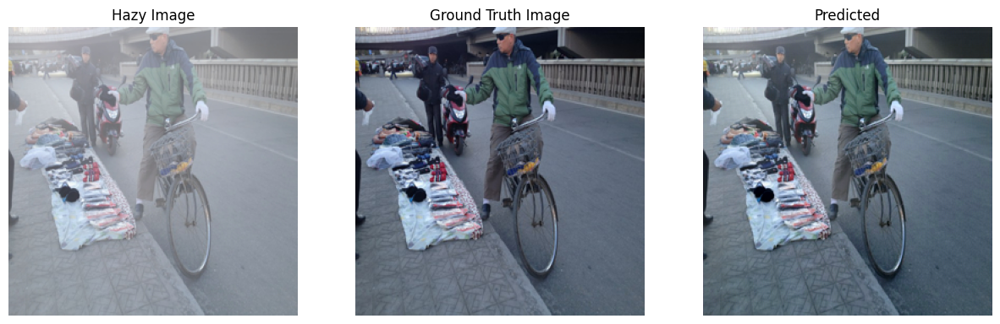

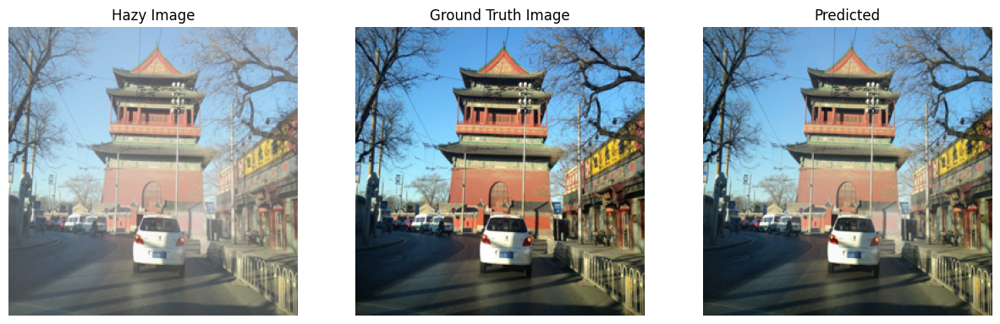

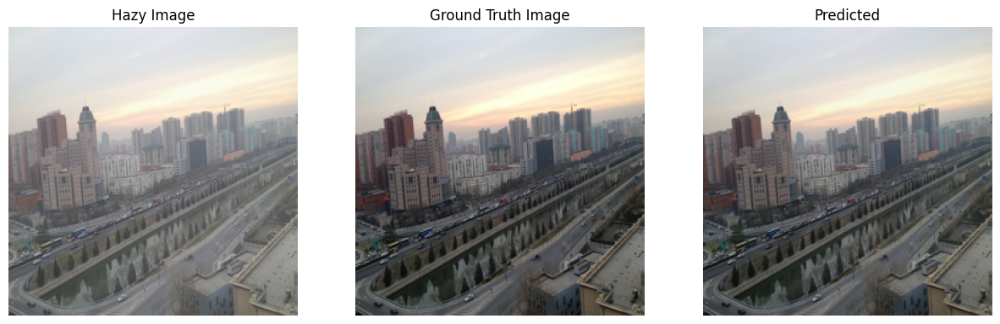

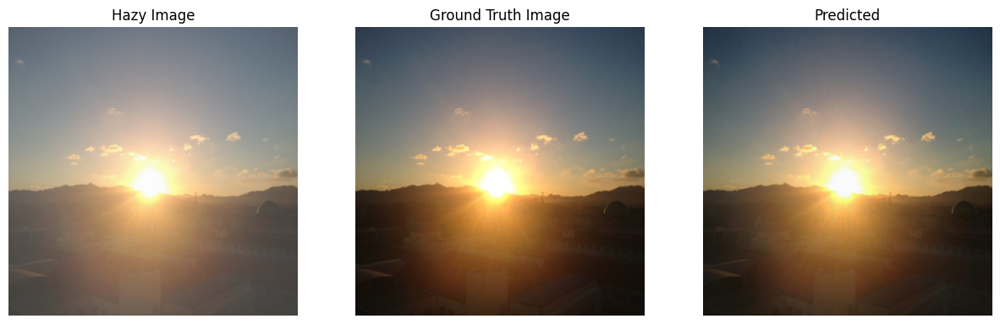

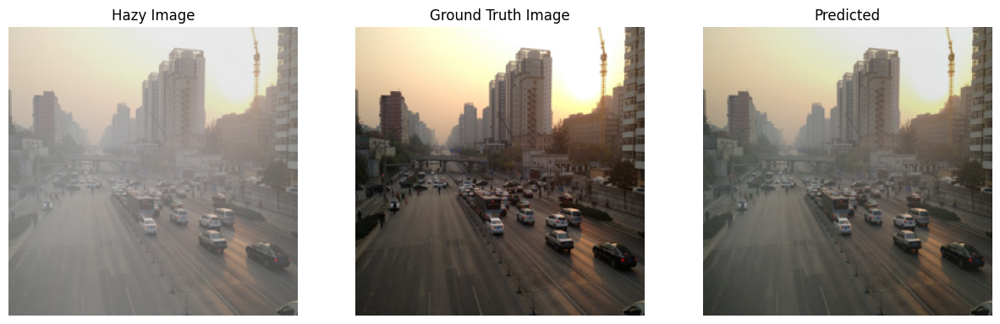

...

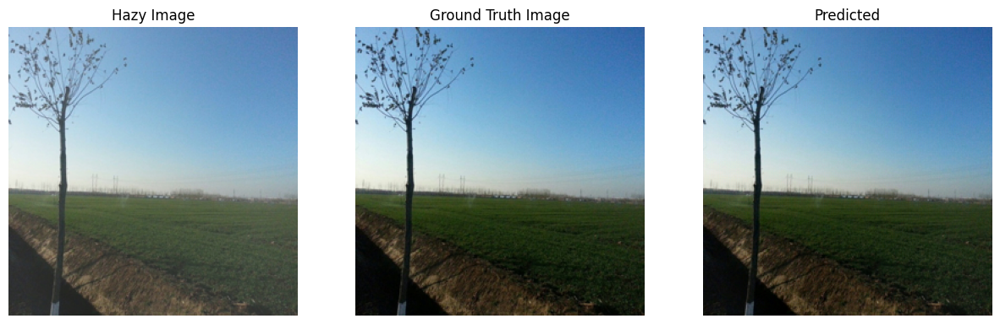

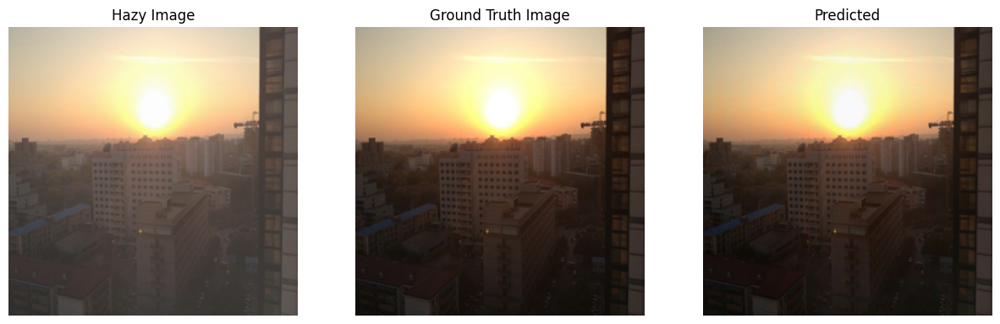

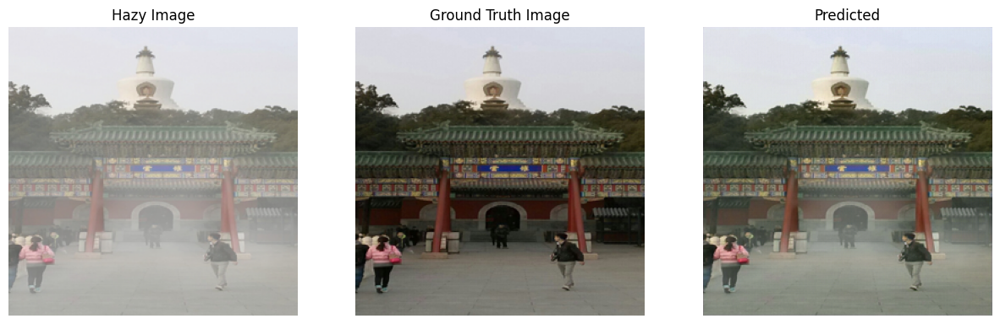

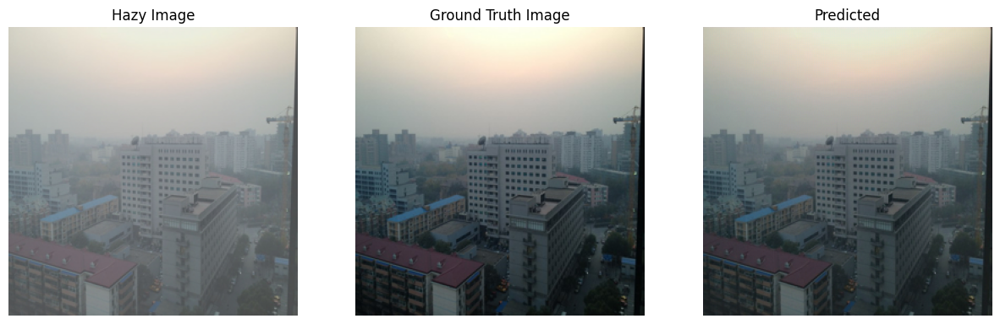

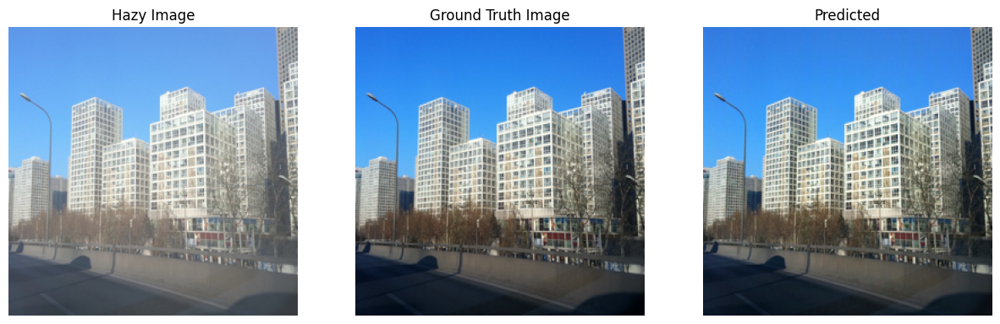

In [ ]:
content_loss = nn.MSELoss()
vgg = vgg16(pretrained=True).features[:23].to(device).eval()  # VGG16 model with features until Conv4_3 layer
optimizer = optim.Adam(netp.parameters(), lr=0.0001)
num_epochs = 10

# Step 5: Training Loop
for epoch in range(num_epochs):
    train_loss = 0.0
    start_time = time.time()
    batch_no = 1
    print(f'Epoch {epoch + 1} started...')

    netp.train()
    checkpoint(epoch)
    for batch in train_dataloader:
        hazy_images = batch['hazy'].to(device)
        clear_images = batch['clear'].to(device)

        # Forward pass
        generated_images = netp(hazy_images)

        # Calculate content loss using VGG16
        features_target = vgg(clear_images)
        features_generated = vgg(generated_images)
        loss_content = content_loss(features_generated, features_target)

        # Calculate loss
        # loss = criterion(outputs, clear_images)
        loss = loss_content

        # Backpropagation and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * hazy_images.size(0)
        batch_no += 1

    train_loss /= len(train_dataloader.dataset)

    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}")

    netp.eval()

    val_loss = 0.0
    if epoch == 9:
        print("val")
        for batch in val_dataloader:
            with torch.no_grad():
              hazy_images = batch['hazy'].to(device)
              clear_images = batch['clear'].to(device)

              # Forward pass
              generated_images = netp(hazy_images)

              show_image(hazy_images[0], clear_images[0], generated_images[0])

              # Calculate content loss using VGG16
              features_target = vgg(clear_images)
              features_generated = vgg(generated_images)
              loss_content = content_loss(features_generated, features_target)

              # Total loss
              loss = loss_content

              val_loss += loss.item() * hazy_images.size(0)

        val_loss /= len(val_dataloader.dataset)


    end_time = time.time()

    print(f'Epoch {epoch + 1} ended, time taken: {end_time - start_time}s')


# Step 6: Save the Trained Model
torch.save(netp.state_dict(), "/content/drive/MyDrive/my_project/latest.pth")

## for testing

In [ ]:
model = netp()  # Instantiate your model
model.load_state_dict(torch.load("/content/drive/MyDrive/my_project/trained_fina.pth"))  # Load the saved weights
model.to(device)  # Move the model to the desired device (CPU or GPU)
model.eval()  # Set the model to evaluation mode

In [ ]:
class TestDataset(data.Dataset):
    def __init__(self, hazy_path):
        super(TestDataset, self).__init__()
        self.hazy_path = hazy_path
        self.hazy_image_list = os.listdir(hazy_path)

    def __getitem__(self, index):
        hazy_image_name = self.hazy_image_list[index]
        hazy_image_path = os.path.join(self.hazy_path, hazy_image_name)

        hazy = Image.open(hazy_image_path).convert('RGB')

        to_tensor = ToTensor()

        hazy = to_tensor(hazy)

        return {'hazy': hazy, 'filename': hazy_image_name}

    def __len__(self):
        return len(self.hazy_image_list)

In [ ]:
test_hazy_path = '/content/drive/MyDrive/my_project/test_imgs'
test_dataset = TestDataset(test_hazy_path)  # Instantiate your test dataset
test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=False)  # Create a dataloader for the test dataset

In [ ]:
output_dir = '/content/drive/MyDrive/my_project/output'
os.makedirs(output_dir, exist_ok=True)

In [ ]:
with torch.no_grad():
    for i, batch in enumerate(test_dataloader):
        hazy_images = batch['hazy'].to(device)

        # Forward pass
        generated_images = model(hazy_images)

        # Convert tensors to numpy arrays and save the generated images
        generated_image = generated_images.cpu().squeeze(0).permute(1, 2, 0).numpy()

        # Save the generated image
        image_name = f"image_{i}.png"  # You can customize the naming scheme as per your preference
        image_path = os.path.join(output_dir, image_name)
        plt.imsave(image_path, generated_image)

        # Display the images if needed
        plt.imshow(generated_image)
        plt.axis('off')
        plt.show()